Originally created by [Samuel Bancroft](https://spiruel.github.io/) for SENSE training 2024 and made available at https://github.com/sciml-leeds/SENSE_training \
Adapted and translated to Pytorch by [Leam Howe](https://leamhowe.github.io/)

# Autoencoders

### Table of contents<font><a class='anchor' id='top'></a>
- [Introduction](#intro)
- [Downloading the dataset](#download)
- [Preparing the dataset](#preparing)
- [Training the autoencoder](#autoencoder)
- [Training the variational autoencoder](#variationalautoencoder)
- [Semi-supervised learning](#ssl)
- [Treasure hunt](#treasurehunt)
- [Further exercises](#stretchgoals)

<a name="intro"></a>
# Introduction

In this training, we will use autoencoders, a type of artificial neural network, to analyse and extract meaningful information from satellite imagery covering the landscapes of the UK. Autoencoders are particularly useful for tasks like image denoising, feature extraction, and even generation of new images.

Usually in a conventional neural network, one tries to predict a target vector $\bf{y}$ from input vectors $\bf{x}$. In an auto-encoder network, one tries to predict $\bf{x}$ from $\bf{x}$. It is trivial to learn a mapping from $\bf{x}$ to $\bf{x}$ if the network has no constraints, but if the network is constrained the learning process becomes more interesting.

By limiting the amount of information that can flow through the network, autoencoders can learn the most important attributes of the input data and how to best reconstruct the original input from an “encoded” state. Ideally, this encoding will learn and describe latent attributes of the input data.

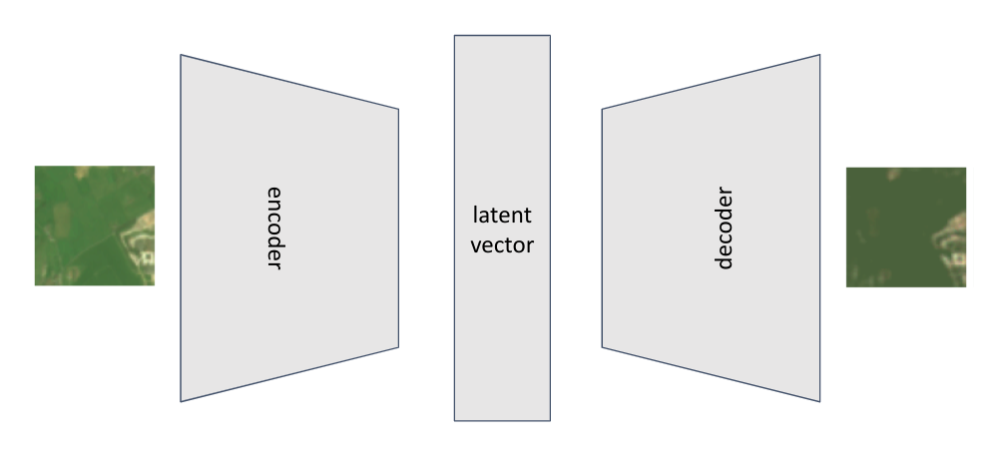

An autoencoder consists of some main components:

1. A section of the network compresses the input (the **encoder**)
2. Another section reverses the process (the **decoder**)

In the middle of these sections, there's a crucial component: a **bottleneck**.

The bottleneck forces the network to simplify the input data, compressing it down into a simpler, streamlined form known as a 'latent space'. Anything that's not essential, goes away.

In the end, the bottleneck gives us a compact representation of the dataset.
This is the main goal of the autoencoder - to create a good, compressed representation of the data.

In [1]:
# import torch

# # Check if CUDA (GPU support) is available
# if torch.cuda.is_available():
#     # Get the number of available GPUs
#     gpus = torch.cuda.device_count()
    
#     # Set memory growth or other configurations for each GPU
#     for gpu in range(gpus):
#         torch.cuda.set_per_process_memory_fraction(1.0, device=gpu)  
# else:
#     print("No GPUs available.")

In [2]:
import torch
# Check if CUDA (GPU support) is available
if not torch.cuda.is_available():
    print("Can't find a GPU to use. Are you on the right kernel?\n(Go to Runtime > Change runtime type)")
elif torch.cuda.is_available():
    print("GPU ready to use. :)")

GPU ready to use. :)


<a name="download"></a>
# Download data
First, we download and unzip the dataset. This consists of red-green-blue Sentinel-2 images over the UK, with an associated .csv file that contains some metadata.

In [6]:
# the ! means we can use command line linux commands
!wget https://gws-access.jasmin.ac.uk/public/sensecdt/eesjb/sense_ae.zip
!unzip sense_ae.zip

--2025-03-18 10:29:52--  https://gws-access.jasmin.ac.uk/public/sensecdt/eesjb/sense_ae.zip
Resolving gws-access.jasmin.ac.uk (gws-access.jasmin.ac.uk)... 130.246.128.97
Connecting to gws-access.jasmin.ac.uk (gws-access.jasmin.ac.uk)|130.246.128.97|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 210219517 (200M) [application/zip]
Saving to: ‘sense_ae.zip’

sense_ae.zip        100%[===================>] 200.48M   145MB/s    in 1.4s    

2025-03-18 10:30:00 (145 MB/s) - ‘sense_ae.zip’ saved [210219517/210219517]

Archive:  sense_ae.zip
   creating: sense_ae_data/
  inflating: sense_ae_data/sense_ae_metadata.csv  
   creating: sense_ae_data/leeds/
  inflating: sense_ae_data/leeds/image_2020_leeds_6_5401_7575.tif  
  inflating: sense_ae_data/leeds/image_2020_leeds_6_8527_6325.tif  
  inflating: sense_ae_data/leeds/image_2020_leeds_6_7230_9067.tif  
  inflating: sense_ae_data/leeds/image_2020_leeds_6_7474_7618.tif  
  inflating: sense_ae_data/leeds/image_2020_leeds

In [1]:
import pandas as pd

df = pd.read_csv('../sense_ae_data/sense_ae_metadata.csv')

print(df.head())
print('---')
print(df.value_counts('location'))

                                            filename  year location  month
0  sense_ae_data/leeds/image_2018_leeds_5_9622_16...  2018    leeds      5
1  sense_ae_data/leeds/image_2020_leeds_4_1698_10...  2020    leeds      4
2  sense_ae_data/leeds/image_2020_leeds_4_8503_77...  2020    leeds      4
3  sense_ae_data/leeds/image_2020_leeds_4_10448_6...  2020    leeds      4
4  sense_ae_data/leeds/image_2018_leeds_5_1_9246.tif  2018    leeds      5
---
location
leeds        4305
edinburgh    2648
Name: count, dtype: int64


<a name="preparing"></a>
# Preparing the data

In [7]:
# Library imports

# We use PyTorch for our neural networks
import torch
import torch.nn as nn
import torch.nn.functional as F

# We use these libraries to find and load TIFF files
from glob import glob
import tifffile

# For maths and plotting
import numpy as np
import matplotlib.pyplot as plt

# For progress bars
from tqdm import tqdm

# For randomization
import random

In [3]:
#load a directory of tiff files for keras
def load_tiff_files(directory):
    files = glob(directory + '/*/*.tif')
    #we shuffle when we can to avoid any biases being introduced later on
    random.shuffle(files)
    images = []
    filepaths = []
    for file in tqdm(files):
      img = tifffile.imread(file)
      if not np.any(np.isnan(img)):
        images.append(img)
        filepaths.append(file)
    return np.array(images), np.array(filepaths)

# Load the data
data, filepaths = load_tiff_files('../sense_ae_data')

print(f'Found {len(data)} files')

100%|██████████| 6953/6953 [00:07<00:00, 898.84it/s] 


Found 6953 files


In [4]:
data_mean, data_std = data.mean(axis=0).mean(axis=0).mean(axis=0), data.std(axis=0).std(axis=0).std(axis=0)
print('data_mean', data_mean, 'data_std', data_std)

#normalise the data so that the dataset has a mean of 0 and a standard deviation of 1.
#This will improve the model training (see what happens when you train a model without this step)
data = (data - data_mean) / data_std

data_mean [0.05510596 0.0637589  0.03778712] data_std [0.00029924 0.00031184 0.00031571]


In [5]:
def unnormalise(image, mean=data_mean, std_=data_std):
  #a useful function for when we want to return an image to its original pixel value range
  #(for plotting purposes)
  return (image*std_)+mean

In [88]:
# def unnormalise(image, mean=data_mean, std_=data_std):
#     """
#     Unnormalises an image by reversing the normalisation process.

#     Args:
#         image (numpy.ndarray or torch.Tensor): The normalised image with shape (H, W, C).
#         mean (numpy.ndarray or torch.Tensor): The mean used for normalisation, shape (C,).
#         std_ (numpy.ndarray or torch.Tensor): The standard deviation used for normalisation, shape (C,).

#     Returns:
#         numpy.ndarray or torch.Tensor: The unnormalised image.
#     """
#     # Reshape mean and std_ to (1, 1, C) for broadcasting
#     mean = mean.reshape(1, 1, -1)
#     std_ = std_.reshape(1, 1, -1)

#     # Reverse the normalisation
#     return (image * std_) + mean

<a name="autoencoder"></a>
# Training the autoencoder

Since our inputs are images, we use convolutional neural networks as encoders and decoders. Autoencoders applied to images are very often convolutional autoencoders - they perform much better than simpler artificial neural networks.

**Encoder:**
* The "encoder" takes an input image (in this case, 64x64 pixels with 3 color channels for RGB) and tries to compress it into a smaller, simpler representation.
* It starts with the original image input.
* Then it passes the image through a series of convolutional layers (Conv2D), each followed by an activation function called ELU and a dropout layer (which helps prevent overfitting).
* These layers gradually reduce the size of the image (downsampling) while learning important features.
* The final output of the encoder is a "latent space" representation, which is a compact version of the input image but with fewer dimensions (in this case, 64 dimensions).

**Decoder:**
* The "decoder" takes this compact representation (the latent space) and tries to reconstruct the original image from it.
* It starts with the compact representation.
* Then it passes it through a series of layers that do the opposite of the encoder: upsampling the image.
* The layers gradually increase the size of the image (Conv2DTranspose layers), with each followed by an ELU activation and a dropout.
* The final output of the decoder is an image that should ideally look like the original input.

**Putting it Together:**
*The "autoencoder" is created by connecting the encoder's input to the decoder's output.
* This creates a full model that takes an image, compresses it into a smaller representation, then tries to reconstruct the original image.
* When training this autoencoder, it tries to minimize the difference between the input image and the reconstructed image. In this case, it's using the Mean Squared Error (MSE) as the measure of this difference.

**Summary:**
* So, in simple terms, this code creates a model that can compress images into a simpler form (encoder), then expand them back to their original form (decoder).
* This can be useful for tasks like reducing the size of images for storage, removing noise from images, or even generating new images.

The compile function at the end is just setting up the model for training, using the Adam optimizer and Mean Squared Error (MSE) as the loss function. This means when you train the model on a dataset, it will try to adjust its internal parameters (weights) to minimize the difference between the original and reconstructed images.

In [13]:
class Autoencoder(nn.Module):
    def __init__(self, input_shape=(64, 64, 3), dropout=0.3, latent_dim=64):
        super(Autoencoder, self).__init__()
        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(input_shape[2], 16, kernel_size=3, padding=1),  # input_shape[2] is the number of channels
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Flatten(),
            nn.Linear(8 * 8 * 128, latent_dim)
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 8 * 8 * 128),
            nn.Unflatten(1, (128, 8, 8)),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.ConvTranspose2d(32, 16, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.ConvTranspose2d(16, input_shape[2], kernel_size=3, padding=1)
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

# Instantiate the model
autoencoder = Autoencoder(input_shape=(64, 64, 3), dropout=0.3, latent_dim=256)

# Optimizer and Loss Function
optimizer = torch.optim.Adam(autoencoder.parameters(), lr=0.001)
loss_fn = nn.MSELoss()




In [14]:
import torch
from torch.utils.data import DataLoader, TensorDataset

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Assuming `data` is a NumPy array or PyTorch tensor
print(0.8 * len(data))

# Split the data into training and validation sets
train_data = data[:5500]
val_data = data[5500:]

# Convert data to PyTorch tensors
train_data = torch.tensor(train_data, dtype=torch.float32).to(device)
val_data = torch.tensor(val_data, dtype=torch.float32).to(device)

# Permute the dimensions to match PyTorch's format: (batch_size, channels, height, width)
train_data = train_data.permute(0, 3, 1, 2)  # From (batch_size, height, width, channels) to (batch_size, channels, height, width)
val_data = val_data.permute(0, 3, 1, 2)


5562.400000000001


In [15]:
import torch
from torch.utils.data import DataLoader, TensorDataset
import torch.nn.functional as F
from tqdm import tqdm

# Assuming the Autoencoder class has been defined as provided previously

# Setup device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Assuming `data` is a NumPy array or PyTorch tensor
print(0.8 * len(data))

# Split the data into training and validation sets
train_data = data[:5500]
val_data = data[5500:]

# Convert data to PyTorch tensors
train_data = torch.tensor(train_data, dtype=torch.float32).to(device)
val_data = torch.tensor(val_data, dtype=torch.float32).to(device)

# Permute the dimensions to match PyTorch's format: (batch_size, channels, height, width)
train_data = train_data.permute(0, 3, 1, 2)  # From (batch_size, height, width, channels) to (batch_size, channels, height, width)
val_data = val_data.permute(0, 3, 1, 2)

# Create a sample DataLoader for demonstration purposes:
# Assuming `train_data` and `val_data` have been defined appropriately
train_dataset = TensorDataset(train_data, train_data)  # x and y are the same for autoencoder tasks
val_dataset = TensorDataset(val_data, val_data)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=0)

# Instantiate and prepare the model
autoencoder = Autoencoder(input_shape=(64, 64, 3), dropout=0.3, latent_dim=256).to(device)
optimizer = torch.optim.Adam(autoencoder.parameters(), lr=0.001)
loss_fn = nn.MSELoss()

# Define the training and validation loop
def train_epoch(loader, model, optimizer, device, loss_fn):
    model.train()
    total_loss = 0
    for imgs, _ in tqdm(loader, desc="Training", leave=False):
        imgs = imgs.to(device)
        optimizer.zero_grad()
        outputs = model(imgs)
        loss = loss_fn(outputs, imgs)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * imgs.size(0)
    return total_loss / len(loader.dataset)

def validate_epoch(loader, model, device, loss_fn):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for imgs, _ in tqdm(loader, desc="Validating", leave=False):
            imgs = imgs.to(device)
            outputs = model(imgs)
            loss = loss_fn(outputs, imgs)
            total_loss += loss.item() * imgs.size(0)
    return total_loss / len(loader.dataset)

# Main training loop
epochs = 25
history = {'train_loss': [], 'val_loss': []}

for epoch in range(epochs):
    print(f"Epoch {epoch+1}/{epochs}")
    train_loss = train_epoch(train_loader, autoencoder, optimizer, device, loss_fn)
    val_loss = validate_epoch(val_loader, autoencoder, device, loss_fn)
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    print(f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

# The history dict now contains train and validation losses for each epoch


5562.400000000001
Epoch 1/25


Train Loss: 5861.2912, Val Loss: 3773.8135
Epoch 2/25


Train Loss: 3800.9519, Val Loss: 3120.2004
Epoch 3/25


Train Loss: 3434.3750, Val Loss: 4030.0804
Epoch 4/25


Train Loss: 3238.5735, Val Loss: 3260.2072
Epoch 5/25


Train Loss: 3062.9832, Val Loss: 3260.4513
Epoch 6/25


Train Loss: 2946.3657, Val Loss: 3373.7057
Epoch 7/25


Train Loss: 2863.6596, Val Loss: 3399.2502
Epoch 8/25


Train Loss: 2804.8517, Val Loss: 3016.7696
Epoch 9/25


Train Loss: 2644.8069, Val Loss: 2843.8643
Epoch 10/25


Train Loss: 2521.5421, Val Loss: 2667.7852
Epoch 11/25


Train Loss: 2495.5819, Val Loss: 2805.2486
Epoch 12/25


Train Loss: 2441.2467, Val Loss: 2749.3976
Epoch 13/25


Train Loss: 2336.7072, Val Loss: 2575.4311
Epoch 14/25


Train Loss: 2332.8719, Val Loss: 2531.4468
Epoch 15/25


Train Loss: 2269.1454, Val Loss: 2349.1182
Epoch 16/25


Train Loss: 2218.0838, Val Loss: 2570.4674
Epoch 17/25


Train Loss: 2195.4231, Val Loss: 2316.9008
Epoch 18/25


Train Loss: 2178.7099, Val Loss: 2246.7409
Epoch 19/25


Train Loss: 2169.1034, Val Loss: 2271.7251
Epoch 20/25


Train Loss: 2133.3959, Val Loss: 2300.1297
Epoch 21/25


Train Loss: 2103.0257, Val Loss: 2451.8593
Epoch 22/25


Train Loss: 2063.6905, Val Loss: 2650.0248
Epoch 23/25


Train Loss: 2006.1971, Val Loss: 2241.6705
Epoch 24/25


Train Loss: 2020.2010, Val Loss: 2364.6774
Epoch 25/25


Train Loss: 1953.1097, Val Loss: 2387.4682


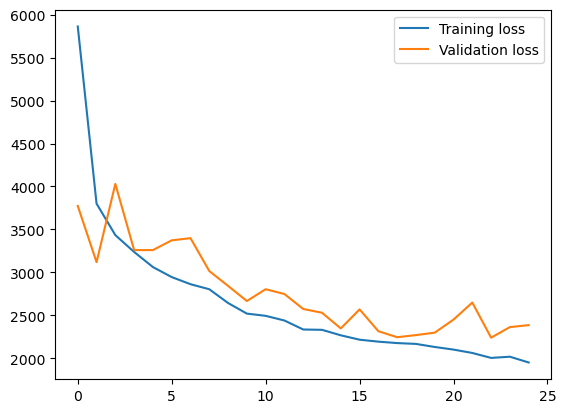

In [16]:
plt.plot(history['train_loss'], label='Training loss')
plt.plot(history['val_loss'], label='Validation loss')
plt.legend()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0534999980665719..2.266000002995762].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.06299998904102172..1.0619999867930732].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.08200000210299896..1.076999995809141].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.040000003127115255..1.2189999932787399].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03199998995576981..1.8409999436303817].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.08099999667914637..1.4257500227908801].


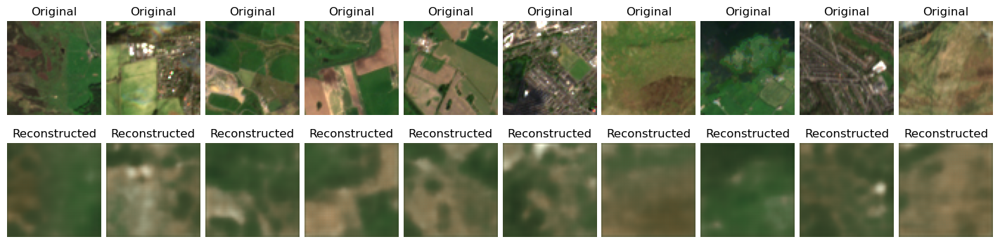

In [17]:
import matplotlib.pyplot as plt
import numpy as np
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
autoencoder = autoencoder.to(device)  # Ensure the model is on the correct device

brightness = 5

# Build two rows of 10 images: top row is original, bottom row is reconstructed
plt.figure(figsize=(20, 4))
for i in range(10):
    # Plot original image
    plt.subplot(2, 10, i + 1)
    original_img = val_data[i].cpu().numpy()  # Transfer to CPU and convert to NumPy for plotting
    original_img = np.transpose(original_img, (1, 2, 0))  # Change from (C, H, W) to (H, W, C)
    plt.imshow(unnormalise(original_img) * brightness)
    plt.axis('off')
    plt.title('Original')

    # Plot reconstructed image
    plt.subplot(2, 10, i + 11)
    with torch.no_grad():  # Disable gradient computation for inference
        # Add extra dimension as the model expects a batch dimension and ensure tensor is on the device
        predicted_img = autoencoder(val_data[i].unsqueeze(0).to(device))
    # Move to CPU, detach, convert to NumPy, and squeeze away the batch dimension
    predicted_img = predicted_img.cpu().detach().numpy().squeeze()
    predicted_img = np.transpose(predicted_img, (1, 2, 0))  # Change from (C, H, W) to (H, W, C)
    plt.imshow(unnormalise(predicted_img) * brightness)
    plt.title('Reconstructed')
    plt.axis('off')

# Reduce spacing between images
plt.subplots_adjust(wspace=-0.5, hspace=0.3)
plt.show()


In [15]:
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt
import torch

pca = PCA(n_components=2)

def plot_latent_space_2d(encoder, data, filepaths, brightness=1.5, labels=10):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    encoder = encoder.to(device)
    encoder.eval()  # Set the model to evaluation mode

    colours = ['red' if 'leeds' in filepath else 'blue' for filepath in filepaths]

    # Convert input data to PyTorch tensor, permute it to match (N, C, H, W), and move to device
    data_tensor = torch.tensor(data, dtype=torch.float).permute(0, 3, 1, 2).to(device)

    # Predict the latent space representations with the encoder
    with torch.no_grad():
        x_encoded = encoder(data_tensor).cpu().numpy()  # Predict and move data back to CPU/numpy

    # Flatten the outputs if necessary (depends on the output shape of the encoder)
    x_encoded = x_encoded.reshape(x_encoded.shape[0], -1)

    # Reduce to 2D using PCA
    x_encoded = pca.fit_transform(x_encoded)

    # Plot the embeddings (that are in 2D) on a scatter plot
    plt.scatter(x_encoded[:, 0], x_encoded[:, 1], c=colours, s=3, alpha=0.25)

    # Plot the idx of images furthest from the origin
    dist = np.sqrt(np.sum(x_encoded**2, axis=1))
    furthest = np.argsort(dist)[::-1][:labels]
    for i in furthest:
        plt.text(x_encoded[i, 0], x_encoded[i, 1], str(i), fontsize=10, alpha=0.75)
    plt.show()

    # Show the images furthest from the origin in a row
    print('Top images furthest from origin:')
    fig, ax = plt.subplots(1, labels, figsize=(20, 2))
    for i in range(labels):
        img = unnormalise(data[furthest[i]]) * brightness
        ax[i].imshow(img)
        ax[i].axis('off')
    plt.show()

    return furthest


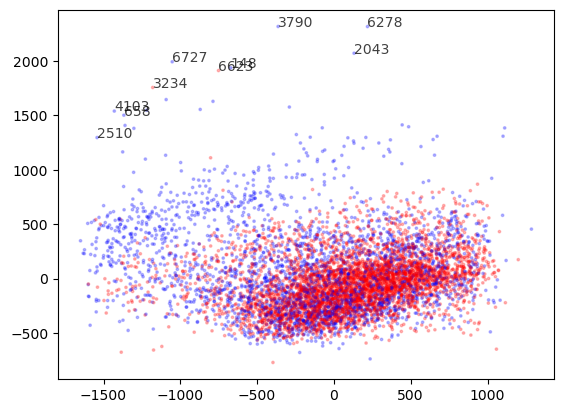

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14985..0.24629999999999996].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10889999999999997..0.41520000000000007].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12555..0.29340000000000005].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0957..0.2157].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1176..0.24270000000000003].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0786..0.31620000000000004].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or 

Top images furthest from origin:


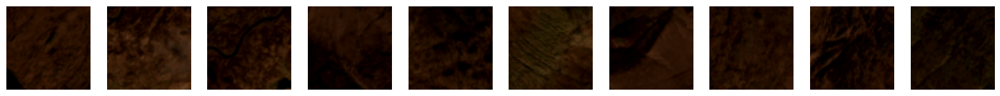

array([3790, 6278, 6727, 3234, 4103, 2043, 6623,  148,  658, 2510])

In [19]:
plot_latent_space_2d(autoencoder.encoder, data, filepaths)

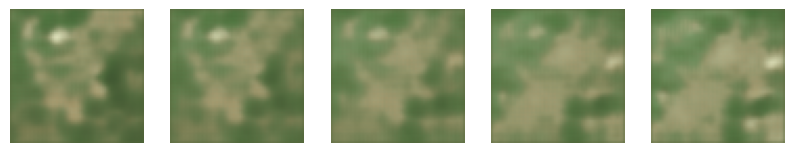

In [20]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# Setup
brightness = 6.5
n = 5  # number of steps in interpolation


# Ensure the model is in evaluation mode
autoencoder.encoder.eval()
autoencoder.encoder.eval()

# Data handling: assuming 'data' is a numpy array and needs proper conversion and device handling
data_tensor = torch.from_numpy(data).float().permute(0, 3, 1, 2).to(device)  # Adjusting from NHWC to NCHW

with torch.no_grad():
    x_encoded = autoencoder.encoder(data_tensor).cpu().numpy()  # Encode the data

# Randomly choose start and end indices
start_idx = np.random.randint(0, len(data))
end_idx = np.random.randint(0, len(data))

# Plotting setup
plt.figure(figsize=(10, 5))

for i in range(n):
    # Interpolate between the encodings
    alpha = i / (n - 1)
    z_sample = x_encoded[start_idx] * (1 - alpha) + x_encoded[end_idx] * alpha

    # Decode the interpolated sample
    z_tensor = torch.from_numpy(z_sample).float().to(device).unsqueeze(0)  # Adjust dimensions and type
    with torch.no_grad():
        x_decoded = autoencoder.decoder(z_tensor).cpu().numpy()

    # Prepare the image for display
    patch = x_decoded[0].transpose(1, 2, 0)  # Assuming output is CxHxW, converting to HxWxC

    # Displaying the interpolated images
    plt.subplot(1, n, i + 1)
    plt.imshow(unnormalise(patch) * brightness)
    plt.axis('off')

plt.show()


Anomaly detection is one application of autoencoders.

In this dataset, most of the clouds have been removed on purpose. The vast majority of images are therefore cloud-free... But there are some images that have been left in.

Here is how an autoencoder help us automatically find these kinds of images:

We train the autoencoder with the entire dataset. Since most satellite images look cloud-free, the model will learn to discard any uncommon characteristics.

The compressed representation will contain common features representative of most images in the data.

What happens if we try autoencoding a cloudy image?

The result of the decoder will be very different from the original picture.

Our model can't reproduce this image as easily from the compressed representation, so we know this is an anomaly!

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.129025..10.857600000000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.54145..6.5806].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5473..2.5506].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5187..2.4284].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.19174999999999998..4.331600000000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.32435..10.904399999999999].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got 

[9786.69710981  747.41519208 2057.48396777 ...  474.93147567 1089.21714523
 2867.1687357 ]


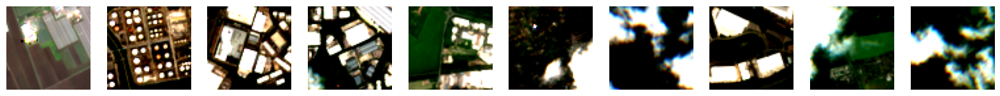

In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
autoencoder = autoencoder.to(device)
autoencoder.eval()

# Assuming 'data' is already loaded as a numpy array
data_tensor = torch.from_numpy(data).float().permute(0, 3, 1, 2).to(device)  # NHWC to NCHW

# Get predictions from the autoencoder
with torch.no_grad():
    preds_tensor = autoencoder(data_tensor).cpu()  # Run model and move output to CPU

# Convert predictions back to NHWC for error calculation
preds = preds_tensor.permute(0, 2, 3, 1).numpy()

# Calculate squared reconstruction error
recon_err = np.mean(np.square(data - preds), axis=(1, 2, 3))

# Determine the top N anomalies
N = 10
anomalies = np.argsort(recon_err)[::-1][:N]

# Print reconstruction errors
print(recon_err)

# Visualization
brightness = 6.5
fig, ax = plt.subplots(1, N, figsize=(N * 2, 2))  # Adjusted subplot dimensions for clarity
for i in range(N):
    anomaly_image = data[anomalies[i]]
    if anomaly_image.shape[2] == 1:  # If grayscale, repeat dimensions to avoid matplotlib error
        anomaly_image = anomaly_image.repeat(3, axis=2)
    ax[i].imshow(unnormalise(anomaly_image) * brightness)
    ax[i].axis('off')
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.068475..1.4113000000000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.09652500000000001..1.9305].


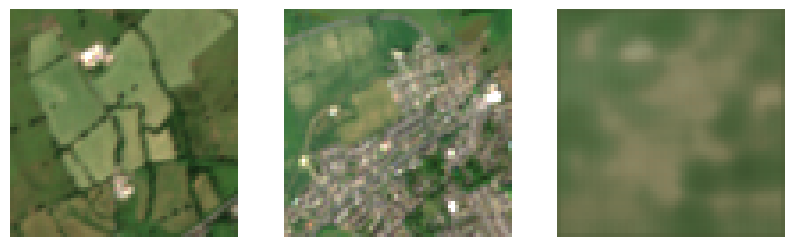

In [22]:
# Setup device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
ae_encoder = autoencoder.encoder.to(device)
ae_decoder = autoencoder.encoder.to(device)

brightness = 5.5

# Assuming 'data' is a numpy array and already loaded
data_tensor = torch.from_numpy(data).float().permute(0, 3, 1, 2).to(device)  # NHWC to NCHW conversion for PyTorch

# Preparing plots
plt.figure(figsize=(10,5))

# Original Image at 'start_idx'
plt.subplot(131)
plt.imshow(unnormalise(data[start_idx])*brightness)
plt.axis('off')  # Hide axes for clarity

# Original Image at 'end_idx'
plt.subplot(132)
plt.imshow(unnormalise(data[end_idx])*brightness)
plt.axis('off')

# Combine the two images using autoencoder
with torch.no_grad():
    # Get encoding of both images
    enc_a = autoencoder.encoder(data_tensor[start_idx].unsqueeze(0))  # Add batch dimension
    enc_b = autoencoder.encoder(data_tensor[end_idx].unsqueeze(0))

    # Combine the encodings
    enc_combined = (enc_a + enc_b) / 2

    # Decode the combined encoding
    dec_combined = autoencoder.decoder(enc_combined)
    dec_combined_np = dec_combined.cpu().permute(0, 2, 3, 1).numpy()  # Convert to NHWC for display and numpy

# Show the combined image
plt.subplot(133)
plt.imshow(unnormalise(dec_combined_np.squeeze()) * brightness)
plt.axis('off')

plt.show()


<a name="variationalautoencoder"></a>
# Variational Autoencoder

Variational Autoencoders were introduced by [Kingma and Welling (2013)](https://arxiv.org/abs/1312.6114).

A variational autoencoder is a type of autoencoder with added constraints on the encoded representations being learned. Instead of letting your neural network learn an arbitrary function like with the simple autoencoder, you are learning the parameters of a probability distribution modelling your data. If you sample points from this distribution, you can generate new input data samples: a VAE is a "generative model".

We aim to construct a generative model rather than a basic data structure that merely "memorises" images. At present, we cannot produce any output since we lack the knowledge to generate latent vectors apart from encoding them from images.

By imposing a constraint on the encoder network, we ensure it generates latent vectors that approximately adhere to a unit Gaussian distribution. This constraint is what distinguishes a variational autoencoder from a conventional one.

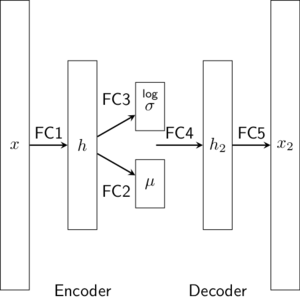

**Encoder:**
- The "encoder" part of the VAE compresses an input image into a lower-dimensional latent space.
- It starts with the original image input.
- Then, similar to the previous autoencoder, it passes the image through a series of convolutional layers, followed by ELU activation and dropout layers.
- However, instead of directly outputting the latent representation, it outputs the mean and variance parameters of a Gaussian distribution that represents the latent space.

**Variational Trick:**
- The "Lambda" layer functions to implement a customized lambda function. In this instance, it is utilized to convert the mean and variance into a representation within a latent space.
- This method enables the model to draw samples from this distribution during training, aiding the Variational Autoencoder (VAE) in acquiring knowledge of a smooth and continuous latent space.
- For a Gaussian distribution, we consider our noise as a standard normal distribution, meaning a Gaussian with a mean of 0 and a variance of 1. This noise element is now separate from and not influenced by our model's parameters.
- A beneficial characteristic of the Gaussian distribution is that to adjust the mean and variance of a sample, we can directly add the mean and then multiply by the variance. This process effectively scales a sample from our noise distribution. The advantage here is that the prediction of mean and variance is no longer dependent on the stochastic sampling operation (the process of generating random samples from the probability distribution).

**Generator (Decoder):**
- The "generator" part of the VAE takes a latent space representation and tries to reconstruct the original image.
- It starts with the latent space representation.
- Then, it goes through a series of layers that gradually upsample the image to the original size.
- Like before, these layers include convolutional transpose layers (Conv2DTranspose), ELU activation, and dropout.

**Noise Layer:**
- This VAE also includes a "noise" layer, which is used during training to make the encoder "variational."
- The noise layer adds randomness to the latent space, which can help improve the model's ability to generate diverse outputs.
- During training, a random noise vector is added to the mean and variance before sampling from the latent space.

**Model Assembly:**
- The "var_encoder" is the model for the encoder part of the VAE.
- The "var_generator" is the model for the generator part of the VAE.
- The "var_autoencoder" combines the encoder, noise layer, and generator to create the full VAE model.
- The "var_autoencoder" is what you train to learn the compressed latent space and the reconstruction process.

**Summary:**
- So, in simple terms, this code creates a Variational Autoencoder, which is an advanced type of autoencoder.
- It uses a more complex encoder that outputs the mean and variance of a Gaussian distribution.
- The decoder then takes samples from this distribution to reconstruct the image.
- The noise layer adds randomness during training to improve the model's ability to generate diverse outputs.
- The model is then compiled for training using the Adam optimizer and Mean Squared Error loss.

**Key Differences from a Simple Autoencoder:**
- The key difference from a simple autoencoder is the variational aspect, which allows for smoother and more structured latent spaces.
- This can be useful for tasks like generating new images, interpolating between images, or exploring the latent space of a dataset.

**How to Use:**
- To use this VAE, you would train it on a dataset of images.
- During training, it tries to reconstruct the original images while also learning a structured and continuous latent space.
- After training, you can generate new images by sampling from the learned latent space.

This kind of VAE architecture is particularly useful for generating new images that retain characteristics of the original dataset while being completely new and unique.


In [8]:
class VariationalAutoencoder(nn.Module):
    def __init__(self, input_shape=(64, 64, 3), dropout=0.3, latent_dim=64):
        super(VariationalAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(input_shape[2], 16, kernel_size=3, padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Flatten(),
        )

        # Latent space
        self.fc_mu = nn.Linear(8 * 8 * 128, latent_dim)
        self.fc_var = nn.Linear(8 * 8 * 128, latent_dim)

        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 8 * 8 * 128),
            nn.Unflatten(1, (128, 8, 8)),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.ConvTranspose2d(32, 16, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.ConvTranspose2d(16, input_shape[2], kernel_size=3, padding=1),
        )

    def reparameterize(self, mu, log_var):
        std = torch.exp(0.5 * log_var)
        eps = torch.randn_like(std)
        return mu + eps * std

    
    def forward(self, x):
        encoded = self.encoder(x)
        mu = self.fc_mu(encoded)
        log_var = self.fc_var(encoded)
        # Clamping the log variance
        log_var = torch.clamp(log_var, min=-10, max=10)
        z = self.reparameterize(mu, log_var)
        decoded = self.decoder(z)
        return decoded, mu, log_var

def vae_loss(recon_x, x, mu, log_var):
    # Reconstruction loss
    BCE = F.mse_loss(recon_x, x, reduction='sum')
    # KL divergence
    KLD = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())
    return BCE + KLD

# Create the VAE
vae = VariationalAutoencoder(input_shape=(64, 64, 3), dropout=0.3, latent_dim=256)
optimizer = torch.optim.Adam(vae.parameters(), lr=0.0005)

# Example forward pass (add a DataLoader in practice)
# loss = vae_loss(*vae(batch_images), batch_images)
# optimizer.zero_grad()
# loss.backward()
# optimizer.step()


In [9]:
print(0.8*len(data))
train_data = data[:5500]
val_data = data[5500:]


5562.400000000001


In [10]:
import torch
from torch.utils.data import DataLoader, TensorDataset
import torch.optim as optim
from tqdm import tqdm

# Setup device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# DataLoader setup
batch_size = 32
train_tensor = torch.tensor(train_data, dtype=torch.float32).permute(0, 3, 1, 2).to(device)
val_tensor = torch.tensor(val_data, dtype=torch.float32).permute(0, 3, 1, 2).to(device)
train_dataset = TensorDataset(train_tensor, train_tensor)  # Assuming train_data is prepared and on the correct device
val_dataset = TensorDataset(val_tensor, val_tensor)  # Assuming val_data is prepared and on the correct device
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

# VAE model, optimizer setup
vae = VariationalAutoencoder(input_shape=(64, 64, 3), dropout=0.3, latent_dim=256).to(device)
optimizer = torch.optim.Adam(vae.parameters(), lr=0.001)
loss_fn = nn.MSELoss()

# Define VAE specific loss function
def vae_loss(recon_x, x, mu, log_var):
    # Reconstruction loss
    recon_loss = F.mse_loss(recon_x, x, reduction='sum')
    # KL divergence
    kl_div = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())
    return recon_loss + kl_div

# Training loop
epochs = 25
history = {'train_loss': [], 'val_loss': []}

for epoch in range(epochs):
    vae.train()
    train_loss = 0.0
    with tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs} - Train", unit="batch") as train_bar:
        for x, y in train_bar:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            
            # Forward pass
            recon_x, mu, log_var = vae(x)
            loss = vae_loss(recon_x, y, mu, log_var)

            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item() * x.size(0)
            train_bar.set_postfix(loss=train_loss / ((train_bar.n + 1) * batch_size))

    # Calculate average training loss
    train_loss /= len(train_loader.dataset)
    history['train_loss'].append(train_loss)

    # Validation phase
    val_loss = 0.0
    vae.eval()
    with tqdm(val_loader, desc="Validating", unit="batch", leave=False) as val_bar:
        for x, y in val_bar:
            x, y = x.to(device), y.to(device)
            with torch.no_grad():
                recon_x, mu, log_var = vae(x)
                loss = vae_loss(recon_x, y, mu, log_var)

            val_loss += loss.item() * x.size(0)

    # Calculate average validation loss
    val_loss /= len(val_loader.dataset)
    history['val_loss'].append(val_loss)

    # Print progress
    print(f"Epoch {epoch + 1}/{epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

# Now `history` contains the training and validation loss for each epoch


Epoch 1/25 - Train: 100%|██████████| 172/172 [00:01<00:00, 160.37batch/s, loss=2.2e+9] 


Epoch 1/25, Train Loss: 2111299334.6095, Val Loss: 1422554432.1321


Epoch 2/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 199.65batch/s, loss=1.45e+9]


Epoch 2/25, Train Loss: 1413093342.3942, Val Loss: 1328568810.9456


Epoch 3/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 200.32batch/s, loss=1.35e+9]


Epoch 3/25, Train Loss: 1306179842.1411, Val Loss: 1188737996.9057


Epoch 4/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 202.64batch/s, loss=1.21e+9]


Epoch 4/25, Train Loss: 1180183623.9593, Val Loss: 1118632174.2051


Epoch 5/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 200.80batch/s, loss=1.16e+9]


Epoch 5/25, Train Loss: 1142443242.8684, Val Loss: 1118936879.4825


Epoch 6/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 201.59batch/s, loss=1.14e+9]


Epoch 6/25, Train Loss: 1100901961.5884, Val Loss: 1053533348.8231


Epoch 7/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 213.10batch/s, loss=1.17e+9]


Epoch 7/25, Train Loss: 1068342870.8073, Val Loss: 1020169872.8259


Epoch 8/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 201.51batch/s, loss=1.02e+9]


Epoch 8/25, Train Loss: 996163902.6502, Val Loss: 928789897.6022


Epoch 9/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 200.59batch/s, loss=9.91e+8]


Epoch 9/25, Train Loss: 963369003.7062, Val Loss: 1029473487.3283


Epoch 10/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 199.53batch/s, loss=9.73e+8]


Epoch 10/25, Train Loss: 933966939.8342, Val Loss: 930411969.8059


Epoch 11/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 198.81batch/s, loss=9.9e+8] 


Epoch 11/25, Train Loss: 939001581.1491, Val Loss: 874056920.4460


Epoch 12/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 197.35batch/s, loss=9.42e+8]


Epoch 12/25, Train Loss: 888234962.4320, Val Loss: 880033650.2574


Epoch 13/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 198.69batch/s, loss=9.05e+8]


Epoch 13/25, Train Loss: 873598212.5615, Val Loss: 898679417.1727


Epoch 14/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 202.11batch/s, loss=9e+8]   


Epoch 14/25, Train Loss: 874327133.2771, Val Loss: 869454139.9477


Epoch 15/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 194.02batch/s, loss=9.04e+8]


Epoch 15/25, Train Loss: 846429017.2742, Val Loss: 853452035.1273


Epoch 16/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 195.49batch/s, loss=8.88e+8]


Epoch 16/25, Train Loss: 836936044.8233, Val Loss: 780138219.3421


Epoch 17/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 206.65batch/s, loss=8.34e+8]


Epoch 17/25, Train Loss: 819574159.2669, Val Loss: 901379483.3531


Epoch 18/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 209.70batch/s, loss=9.24e+8]


Epoch 18/25, Train Loss: 822520207.4996, Val Loss: 893004750.4033


Epoch 19/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 206.55batch/s, loss=8.15e+8]


Epoch 19/25, Train Loss: 806475757.3818, Val Loss: 830840688.1872


Epoch 20/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 209.10batch/s, loss=8.98e+8]


Epoch 20/25, Train Loss: 788755406.7084, Val Loss: 875755696.3193


Epoch 21/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 205.74batch/s, loss=7.98e+8]


Epoch 21/25, Train Loss: 784758242.6298, Val Loss: 832294979.3476


Epoch 22/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 214.31batch/s, loss=8.84e+8]


Epoch 22/25, Train Loss: 802502322.2691, Val Loss: 812263754.6153


Epoch 23/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 207.78batch/s, loss=8.16e+8]


Epoch 23/25, Train Loss: 811832482.0247, Val Loss: 762642166.7061


Epoch 24/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 212.46batch/s, loss=8.45e+8]


Epoch 24/25, Train Loss: 752010278.3069, Val Loss: 919187420.3661


Epoch 25/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 220.52batch/s, loss=8.1e+8] 
                                                     

Epoch 25/25, Train Loss: 749248390.9585, Val Loss: 720369502.7447


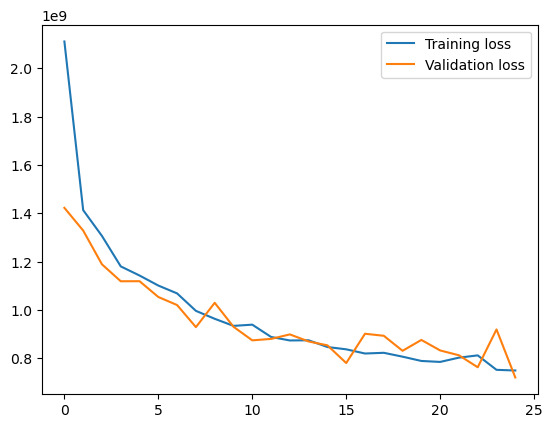

In [11]:
plt.plot(history['train_loss'], label='Training loss')
plt.plot(history['val_loss'], label='Validation loss')
# plt.ylim(0, 1e10)  # Adjust y-axis limits for better visualization
plt.legend()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0030000000000000165..1.0090000000000001].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04200000000000001..1.1717500000000003].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11124999999999996..0.9734999999999999].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.00918260077369528..0.7888152813857406].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.20750000000000002..0.47150000000000003].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07700499119968826..0.388723331923472].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.05700000000000004..1.449].
Clipping input data to the vali

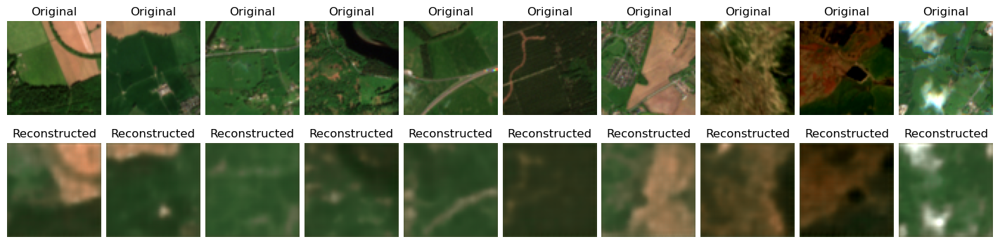

In [12]:
import torch
import matplotlib.pyplot as plt
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vae = vae.to(device)  # Ensure the model is on the correct device

brightness = 5


# Build two rows of 10 images: top row is original, bottom row is reconstructed
plt.figure(figsize=(20, 4))
for i in range(10):
    # Plot original image
    plt.subplot(2, 10, i + 1)
    original_img = val_data[i] #.cpu().numpy()  # Transfer to CPU and convert to NumPy for plotting
    # original_img = np.transpose(original_img, (1, 2, 0))  # Change from (C, H, W) to (H, W, C)
    plt.imshow(unnormalise(original_img) * brightness)
    plt.axis('off')
    plt.title('Original')

    # Plot reconstructed image
    plt.subplot(2, 10, i + 11)
    with torch.no_grad():  # Disable gradient computation for inference
        # Add extra dimension as the model expects a batch dimension and ensure tensor is on the device
        predicted_img, _, _ = vae(val_tensor[i].unsqueeze(0).to(device))
    # Move reconstruction to CPU, detach, convert to NumPy, and squeeze away the batch dimension
    predicted_img = predicted_img.cpu().detach().numpy().squeeze()
    predicted_img = np.transpose(predicted_img, (1, 2, 0))  # Change from (C, H, W) to (H, W, C)
    plt.imshow(unnormalise(predicted_img) * brightness)
    plt.title('Reconstructed')
    plt.axis('off')

# Reduce spacing between images
plt.subplots_adjust(wspace=-0.5, hspace=0.3)
plt.show()


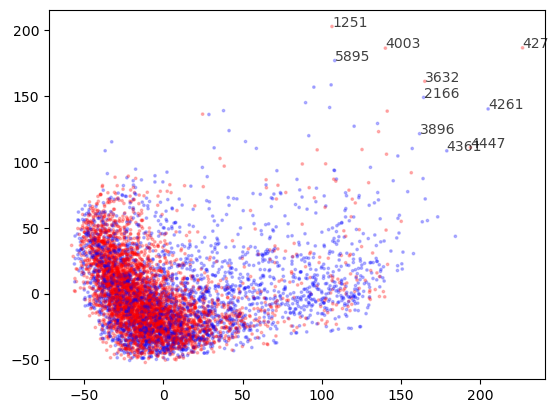

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03875000000000001..0.1844].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0456..0.1602].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03990000000000002..0.1868].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.035100000000000006..0.37].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0421..0.1962].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.037849999999999995..0.1904].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got 

Top images furthest from origin:


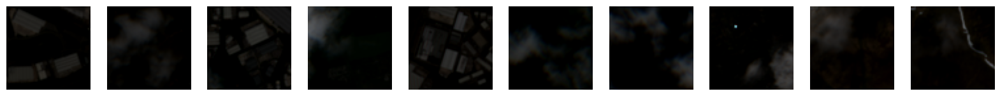

array([ 427, 4261, 4003, 3632, 1251, 4447, 2166, 4361, 5895, 3896])

In [16]:
plot_latent_space_2d(vae.encoder, data, filepaths, brightness=0.5)

<a name="ssl"></a>
# Semi-supervised learning

A pre-trained model such as a VAE can be fine-tuned for a classification task, particularly when labeled data is limited. We will compare the performance of a model that uses a pre-trained autoencoder's learned features against a model that starts with randomly initialised weights.

The combination of unsupervised learning as a 'pretext' task, followed by some supervised learning, is a form of semi-supervised learning.

**Feature Transfer**: The encoder part of an autoencoder has learned to extract essential features from the data during its reconstruction process. We will see how these features, even though initially trained for a different purpose, can be extremely useful for classification.

1. Load a pre-trained autoencoder.
2. Modify the model to be a classifier.
3. Train the model on a semi-supervised dataset.
4. Now remake the autoencoder with random initial weights. Compare the accuracy of the pretrained autoencoder to the untrained one, when finetuned to a classification task.

In [29]:
data.shape

(6953, 64, 64, 3)

In [30]:
#make a classification task to predict whether the location is in Scotland or England. Ensure that the classes are balanced (see sense_ae_metadata.csv)
location = np.array([1 if 'leeds' in i else 0 for i in filepaths])

In [31]:
n=1000
batch_size = 32

# Prepare data for classification
train_data = data[:n]
val_data = data[n:]
train_labels= location[:n]
val_labels = location[n:]

# Prepare the dataset with labels
train_data_tensor = torch.tensor(train_data, dtype=torch.float32).permute(0, 3, 1, 2)
train_labels_tensor = torch.tensor(train_labels, dtype=torch.long)  # Assuming location is your label array

train_dataset = TensorDataset(train_data_tensor, train_labels_tensor)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

val_data_tensor = torch.tensor(val_data, dtype=torch.float32).permute(0, 3, 1, 2)
val_labels_tensor = torch.tensor(val_labels, dtype=torch.long)  # Assuming location is your label array

val_dataset = TensorDataset(val_data_tensor, val_labels_tensor)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [32]:
class VAEClassifier(nn.Module):
    def __init__(self, vae, num_classes=2):
        super(VAEClassifier, self).__init__()
        self.vae = vae
        for param in self.vae.parameters():
            param.requires_grad = False
        self.classifier = nn.Sequential(
            nn.Linear(256, 128),  # Assuming latent_dim is 256
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, num_classes))
        
    # def reparameterize(self, mu, log_var):
    #     log_var = torch.clamp(log_var, min=-10, max=10)  # Clamp log_var
    #     std = torch.exp(0.5 * log_var)
    #     eps = torch.randn_like(std)
    #     return mu + eps * std
    
    def forward(self, x):
        with torch.no_grad():
            encoded = self.vae.encoder(x)
            mu = self.vae.fc_mu(encoded)
            log_var = self.vae.fc_var(encoded)
            log_var = torch.clamp(log_var, min=-10, max=10)  # Clamp log_var
            z = self.vae.reparameterize(mu, log_var)
            
            # Debug: Print latent vector statistics
            # print("Latent vector - mean:", z.mean().item(), "std:", z.std().item())
        
        logits = self.classifier(z)
        
        # Debug: Print logits
        # print("Logits - mean:", logits.mean().item(), "std:", logits.std().item())
        
        return logits

In [33]:
# Initialize the VAEClassifier
vae_classifier = VAEClassifier(vae, num_classes=2).to(device)

# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(vae_classifier.parameters(), lr=0.0001)

# Training loop
epochs = 20
history = {'train_loss': [], 'train_accuracy': [], 'val_loss': [], 'val_accuracy': []}

for epoch in range(epochs):
    vae_classifier.train()
    train_loss = 0.0
    correct = 0
    total = 0
    
    with tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs} - Train", unit="batch") as train_bar:
        for x, y in train_bar:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            
            # Forward pass
            logits = vae_classifier(x)
            loss = criterion(logits, y)
            
            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item() * x.size(0)
            _, predicted = logits.max(1)
            total += y.size(0)
            correct += predicted.eq(y).sum().item()
            
            train_bar.set_postfix(loss=train_loss / ((train_bar.n + 1) * batch_size), 
                                 accuracy=100. * correct / total)
    
    # Calculate average training loss and accuracy
    train_loss /= len(train_loader.dataset)
    train_accuracy = 100. * correct / total
    history['train_loss'].append(train_loss)
    history['train_accuracy'].append(train_accuracy)
    
    # Validation phase
    val_loss = 0.0
    correct = 0
    total = 0
    vae_classifier.eval()
    with tqdm(val_loader, desc="Validating", unit="batch", leave=False) as val_bar:
        for x, y in val_bar:
            x, y = x.to(device), y.to(device)
            with torch.no_grad():
                logits = vae_classifier(x)
                loss = criterion(logits, y)
            
            val_loss += loss.item() * x.size(0)
            _, predicted = logits.max(1)
            total += y.size(0)
            correct += predicted.eq(y).sum().item()
    
    # Calculate average validation loss and accuracy
    val_loss /= len(val_loader.dataset)
    val_accuracy = 100. * correct / total
    history['val_loss'].append(val_loss)
    history['val_accuracy'].append(val_accuracy)
    
    # Print progress
    print(f"Epoch {epoch + 1}/{epochs}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")

Epoch 1/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 101.10batch/s, accuracy=55.2, loss=58]


Epoch 1/20, Train Loss: 3.7148, Train Accuracy: 55.20%, Val Loss: 2.3481, Val Accuracy: 62.74%


Epoch 2/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 124.14batch/s, accuracy=62, loss=33.5]


Epoch 2/20, Train Loss: 3.2155, Train Accuracy: 62.00%, Val Loss: 2.0910, Val Accuracy: 63.68%


Epoch 3/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 128.65batch/s, accuracy=60.7, loss=14.6]


Epoch 3/20, Train Loss: 2.7940, Train Accuracy: 60.70%, Val Loss: 1.9780, Val Accuracy: 63.67%


Epoch 4/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 145.49batch/s, accuracy=60.4, loss=20.7]


Epoch 4/20, Train Loss: 2.6433, Train Accuracy: 60.40%, Val Loss: 1.8483, Val Accuracy: 63.43%


Epoch 5/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 126.62batch/s, accuracy=63.5, loss=22.3]


Epoch 5/20, Train Loss: 2.1424, Train Accuracy: 63.50%, Val Loss: 1.7612, Val Accuracy: 63.50%


Epoch 6/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 138.95batch/s, accuracy=64.2, loss=12.9]


Epoch 6/20, Train Loss: 2.0648, Train Accuracy: 64.20%, Val Loss: 1.7111, Val Accuracy: 63.36%


Epoch 7/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 116.63batch/s, accuracy=65.2, loss=21.2]


Epoch 7/20, Train Loss: 2.0369, Train Accuracy: 65.20%, Val Loss: 1.6532, Val Accuracy: 63.55%


Epoch 8/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 134.82batch/s, accuracy=65, loss=14.4]


Epoch 8/20, Train Loss: 1.8405, Train Accuracy: 65.00%, Val Loss: 1.5820, Val Accuracy: 63.55%


Epoch 9/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 139.58batch/s, accuracy=65.4, loss=9.08]


Epoch 9/20, Train Loss: 1.7442, Train Accuracy: 65.40%, Val Loss: 1.5429, Val Accuracy: 63.36%


Epoch 10/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 127.93batch/s, accuracy=67.8, loss=17.2]


Epoch 10/20, Train Loss: 1.6540, Train Accuracy: 67.80%, Val Loss: 1.4789, Val Accuracy: 63.35%


Epoch 11/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 140.74batch/s, accuracy=67.5, loss=9.31]


Epoch 11/20, Train Loss: 1.4893, Train Accuracy: 67.50%, Val Loss: 1.4377, Val Accuracy: 63.55%


Epoch 12/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 124.48batch/s, accuracy=69.5, loss=14.7]


Epoch 12/20, Train Loss: 1.4093, Train Accuracy: 69.50%, Val Loss: 1.4084, Val Accuracy: 63.26%


Epoch 13/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 119.60batch/s, accuracy=67, loss=14.8]


Epoch 13/20, Train Loss: 1.4185, Train Accuracy: 67.00%, Val Loss: 1.4305, Val Accuracy: 64.03%


Epoch 14/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 136.62batch/s, accuracy=68.8, loss=13]


Epoch 14/20, Train Loss: 1.2523, Train Accuracy: 68.80%, Val Loss: 1.4023, Val Accuracy: 63.68%


Epoch 15/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 133.59batch/s, accuracy=68.6, loss=12.3]


Epoch 15/20, Train Loss: 1.1794, Train Accuracy: 68.60%, Val Loss: 1.3606, Val Accuracy: 63.04%


Epoch 16/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 132.04batch/s, accuracy=71.5, loss=10.5]


Epoch 16/20, Train Loss: 1.0107, Train Accuracy: 71.50%, Val Loss: 1.3713, Val Accuracy: 63.38%


Epoch 17/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 140.96batch/s, accuracy=71.5, loss=7.71]


Epoch 17/20, Train Loss: 0.9873, Train Accuracy: 71.50%, Val Loss: 1.3678, Val Accuracy: 64.15%


Epoch 18/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 136.58batch/s, accuracy=71.3, loss=11.4]


Epoch 18/20, Train Loss: 1.0899, Train Accuracy: 71.30%, Val Loss: 1.3303, Val Accuracy: 63.61%


Epoch 19/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 124.06batch/s, accuracy=72.2, loss=9.69]


Epoch 19/20, Train Loss: 0.9305, Train Accuracy: 72.20%, Val Loss: 1.3264, Val Accuracy: 63.46%


Epoch 20/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 104.64batch/s, accuracy=74, loss=1.38]   
                                                                 

Epoch 20/20, Train Loss: 0.9269, Train Accuracy: 74.00%, Val Loss: 1.2859, Val Accuracy: 62.74%


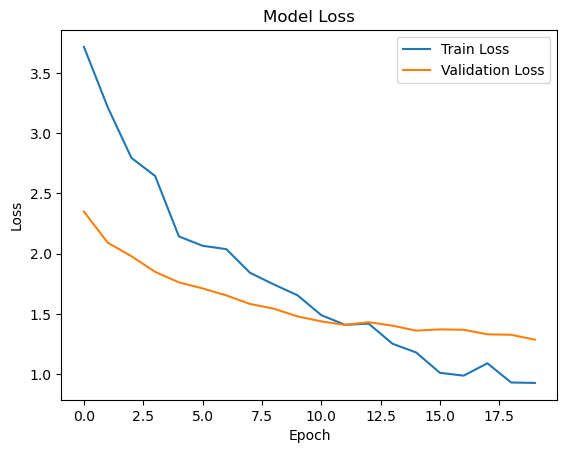

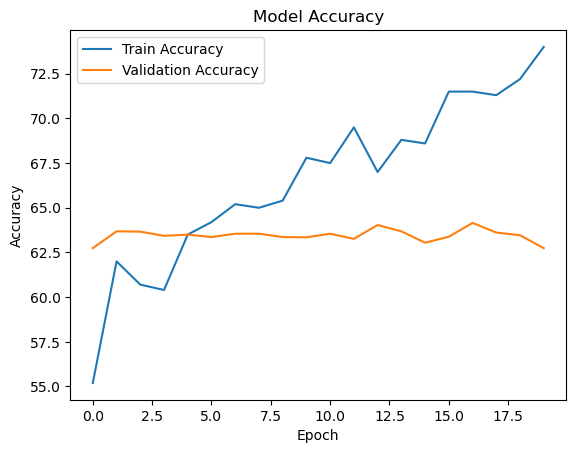

In [34]:
import matplotlib.pyplot as plt

# Plot training & validation loss values
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training & validation accuracy values
plt.plot(history['train_accuracy'], label='Train Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

<a name="treasurehunt"></a>
# Autoencoder treasure hunt

Clues have been hidden in a Sentinel 2 image. Your job is to find the treasure using an autoencoder - searching through many square kilometres of imagery much faster than if you looked through everything by hand!

Firstly, we read the image in as a cloud-optimised geotiff (COG), and view it:

In [53]:
#install the library to read a COG as an xarray
!pip install rioxarray --quiet

In [17]:
cog_url  = ('https://homepages.see.leeds.ac.uk/~eesjb/sense_training_march24/'
            'leeds_cog.tif')

import rioxarray
rds = rioxarray.open_rasterio(cog_url)
rds

<xarray.DataArray (band: 3, y: 5000, x: 3928)> Size: 471MB
[58920000 values with dtype=float64]
Coordinates:
  * band         (band) int64 24B 1 2 3
  * x            (x) float64 31kB 5.705e+05 5.705e+05 ... 6.098e+05 6.098e+05
  * y            (y) float64 40kB 5.987e+06 5.987e+06 ... 5.937e+06 5.937e+06
    spatial_ref  int64 8B 0
Attributes:
    resolution:     10.0
    spec:           RasterSpec(epsg=32630, bounds=(499980.0, 5890200.0, 60978...
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0
    long_name:      stackstac-a59c0526e158aaff38198e5e514e7988

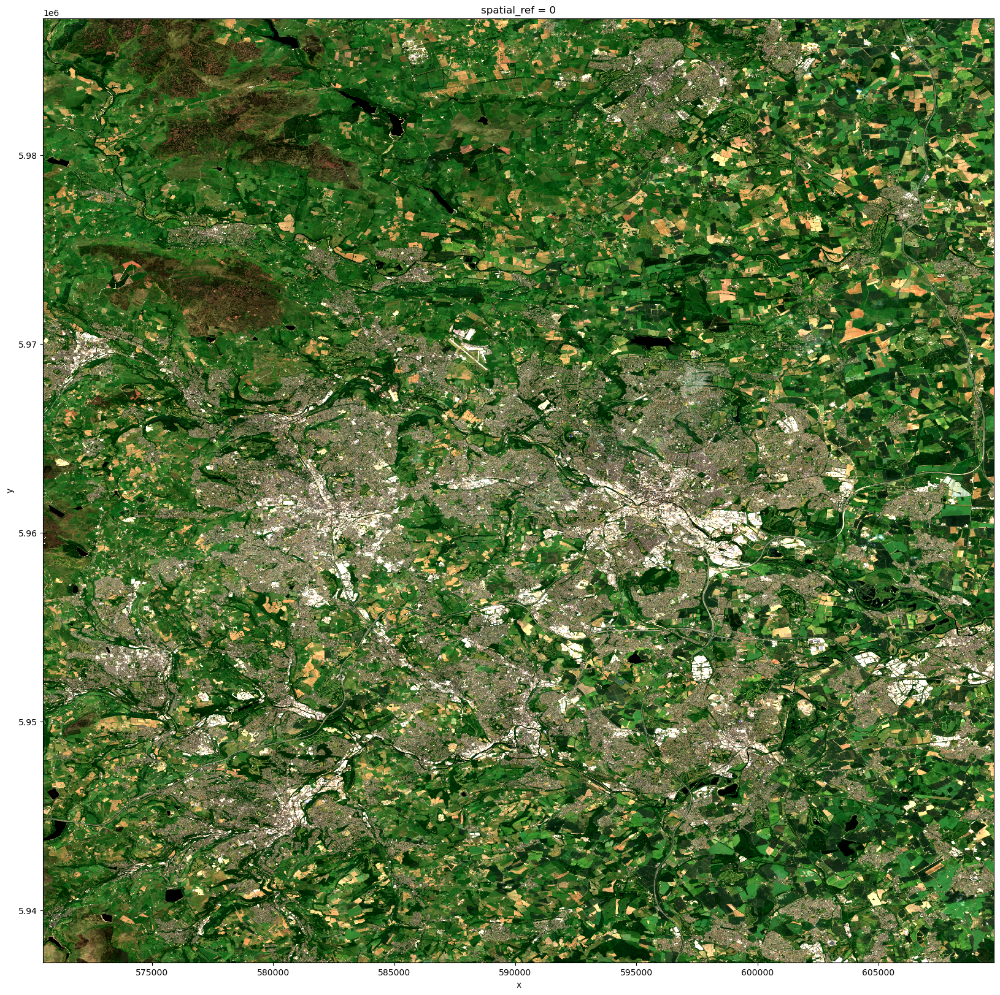

In [36]:
rds.plot.imshow(robust=True, figsize=(20,20))

In [18]:
#cut out a 64x64 pixel window from the cog in sliding window fashion
import rasterio
from rasterio.windows import Window

imgs = []
brightness = 5

# Open the COG
with rasterio.open(cog_url) as src:
    # Loop through the windows
    for i in tqdm(range(5000//32)):
        for j in range(5000//32):
            window = Window(i*64, j*64, 64, 64)
            subset = src.read(window=window)
            # if subset.shape[1] == 64 and subset.shape[2] == 64:
            #     plt.imshow(subset.transpose(1,2,0)*brightness)
            #     plt.show()

            img = subset.transpose(1,2,0)
            if img.shape == (64,64,3):
                imgs.append(img)

imgs = np.array(imgs)

100%|██████████| 156/156 [00:24<00:00,  6.49it/s]


In [69]:
imgs.shape

(4758, 64, 64, 3)

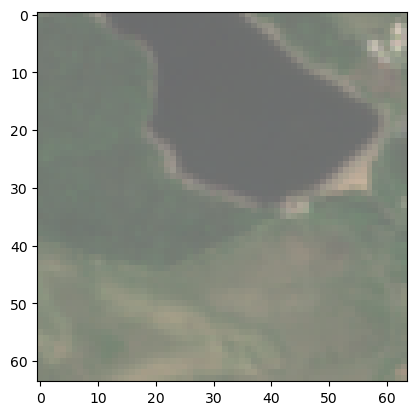

In [19]:
plt.imshow((imgs[200]+0.3)*2)

In [1]:
## Now it's your turn! Use the VAE to identify the anomalies in the COG dataset and display them to reveal the hidden message.

####### Insert your code here ######## 

# step 1: prepare the data


# step 2: run the VAE to get the reconstruction error


# step 3: identify the anomalies


# step 4: display the anomalies to reveal the hidden message
# remember to unnormalise the images before displaying them


# step 5: celebrate your success! 🎉

<a name="stretchgoals"></a>
# Pushing autoencoders further

1. Change the training data to explore new uses for the autoencoder
- create a summer to winter image converter. See [**download script here**](https://github.com/sciml-leeds/SENSE_training/blob/main/download_ae_data.ipynb).
- create an image denoiser

2. Use the VAE as a GCM
- [(inspired by this work)](https://brohan.org/ML_GCM/)
- train VAE on weather data where x is atmosphere at $t$, and y is atmosphere at $t+6$ hours
- run the VAE predictor repeatedly to produce a GCM forecast model
- [**See example notebook here**](https://github.com/sciml-leeds/SENSE_training/blob/main/download_autoencode_gcm_data.ipynb)

3. Detect natural anomalies using the VAE
- see papers eg [eg. detecting avalanches](https://hal.science/hal-02318407/document).

4. Use the VAE for further semi-supervised learning experiments
- initialise the VAE without training
- use the VAE decoder and using $x$ as your image patches and $y$ as your class labels, train a model to discriminate between leeds and edinburgh patches (store the results)
- initialise the VAE again, and train the autoencoder where $x$=$y$. Then take the VAE decoder only and train again to fine-tune to discriminate between leeds and edinburgh patches. What's the difference in the accuracy?

5. Explore the latent space in new ways
- define a starting patch, and a target patch. Find the real images that are the stepping stones on a path in the latent space from the start to the target patch. Plot your results to see the journey from 'car park' to 'beach' eg. [tile2vec latent space exploration](https://ermongroup.github.io/blog/public/img/blog/tile2vec/latent.png).

